In [73]:
#Not all these packages are required but they are here for completeness
import importlib
import io
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw, ImageStat
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools import stain_normalizer, LuminosityStandardizer

%matplotlib inline

In [2]:
# Import package 
BASE_DIR = Path().resolve()
HEMNET_DIR = BASE_DIR.parent.joinpath('HEMnet')

os.chdir(HEMNET_DIR)
from slide import *
from utils import *

In [94]:
# User Input parameters
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides')
HE_JPEGS_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/jpegs/HandE')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_10x_09_12_19')
TEMPLATE_SLIDE_PATH = SLIDES_PATH.joinpath('2171_T_11524A_2_HandE.svs')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()

he_img_names = []
for img in HE_JPEGS_PATH.glob('*.jpeg'):
    name = img.name
    he_img_names.append(name)
he_img_names.sort()
he_img_names

['1792_T_9500_3_HandE_small.jpeg',
 '1794_T_9504_3_HandE_small.jpeg',
 '1798_T_9514_3_HandE_small.jpeg',
 '1820_N_10545A_2_HandE_small.jpeg',
 '1820_T_105452F_2_HandE_small.jpeg',
 '1843_T_9561_3_HandE_small.jpeg',
 '1879_T_9580_3_HandE_small.jpeg',
 '1910_T_9637_3_HandE_small.jpeg',
 '1915_T_10464_3_HandE_small.jpeg',
 '1919_T_10779_3_HandE_small.jpeg',
 '1928_T_9644_3_HandE_small.jpeg',
 '1932_T_9876_3_HandE_small.jpeg',
 '1939_T_9661_3_HandE_small.jpeg',
 '1957_T_9668_3_HandE_small.jpeg',
 '2011_T_9699_3_HandE_small.jpeg',
 '2019_T_9717_3_HandE_small.jpeg',
 '2023_T_9727_3_HandE_small.jpeg',
 '2036_T_9729_3_HandE_small.jpeg',
 '2038_T_11986_3_HandE_small.jpeg',
 '2065_N_12752A_2_HandE_small.jpeg',
 '2065_T_12756A_2_HandE_small.jpeg',
 '2075_T_9787_3_HandE_small.jpeg',
 '2090_T_10594_3_HandE_small.jpeg',
 '2107_T_9806_3_HandE_small.jpeg',
 '2112_N_12341B_2_HandE_small.jpeg',
 '2112_T_12335F_2_HandE_small.jpeg',
 '2148_N_11397A_2_HandE_small.jpeg',
 '2148_T_11393A_2_HandE_small.jpeg',

In [96]:
HE_slides = [slide for slide in slides if 'HandE' in slide]
HE_slides

['1792_T_9500_3_HandE.svs',
 '1794_T_9504_3_HandE.svs',
 '1798_T_9514_3_HandE.svs',
 '1820_N_10545A_2_HandE.svs',
 '1820_T_105452F_2_HandE.svs',
 '1843_T_9561_3_HandE.svs',
 '1879_T_9580_3_HandE.svs',
 '1910_T_9637_3_HandE.svs',
 '1915_T_10464_3_HandE.svs',
 '1919_T_10779_3_HandE.svs',
 '1928_T_9644_3_HandE.svs',
 '1932_T_9876_3_HandE.svs',
 '1939_T_9661_3_HandE.svs',
 '1957_T_9668_3_HandE.svs',
 '2011_T_9699_3_HandE.svs',
 '2019_T_9717_3_HandE.svs',
 '2023_T_9727_3_HandE.svs',
 '2036_T_9729_3_HandE.svs',
 '2038_T_11986_3_HandE.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_T_12756A_2_HandE.svs',
 '2075_T_9787_3_HandE.svs',
 '2090_T_10594_3_HandE.svs',
 '2107_T_9806_3_HandE.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_T_12335F_2_HandE.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_T_11393A_2_HandE.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_T_11524A_2_HandE.svs',
 '232_T_13230_3_HandE.svs',
 '2382_T_15360_3_HandE.svs',
 '526_T_15907_3_HandE.svs',
 '526_T_15915_3_HandE.svs',
 '526_T_15923_3_HandE.

In [4]:
SLIDE_NUM = 0
PREFIX = he_img_names[SLIDE_NUM][:-16]
verbose_print('Processing Slide: {0}'.format(PREFIX))

Processing Slide: 1792_T_9500_3_


In [5]:
he_imgs = []
for name in he_img_names:
    he_imgs.append(Image.open(HE_JPEGS_PATH.joinpath(name)))

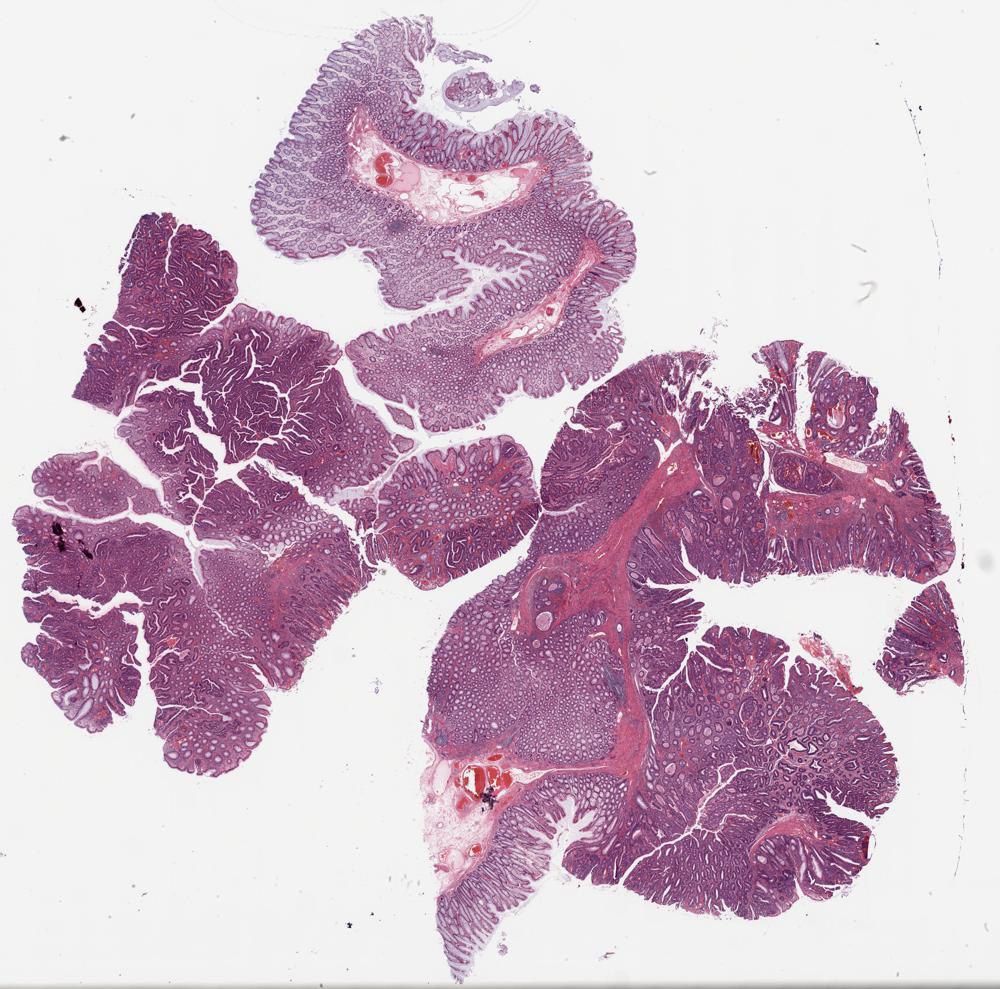

In [6]:
he_imgs[1]

In [7]:
len(he_imgs)

35

In [8]:
def thumbnail(img, size = (1000,1000)):
    """Converts Pillow images to a different size without modifying the original image
    """
    img_thumbnail = img.copy()
    img_thumbnail.thumbnail(size)
    return img_thumbnail

In [9]:
def img_grid(imgs, thumbnail_size = (200,200), size = (7,5)):
    thumbnail_width, thumbnail_height = thumbnail_size
    img_width, img_height = size[1]*thumbnail_width, size[0]*thumbnail_height
    blank_img = Image.new('RGB', (img_width, img_height), (255, 255, 255))
    i = 0
    for y in range(size[1]):
        for x in range(size[0]):
            img = imgs[i].convert('RGB')
            img_small = thumbnail(img, size = thumbnail_size)
            blank_img.paste(img_small, (y*thumbnail_width, x*thumbnail_height))
            i += 1
    return blank_img

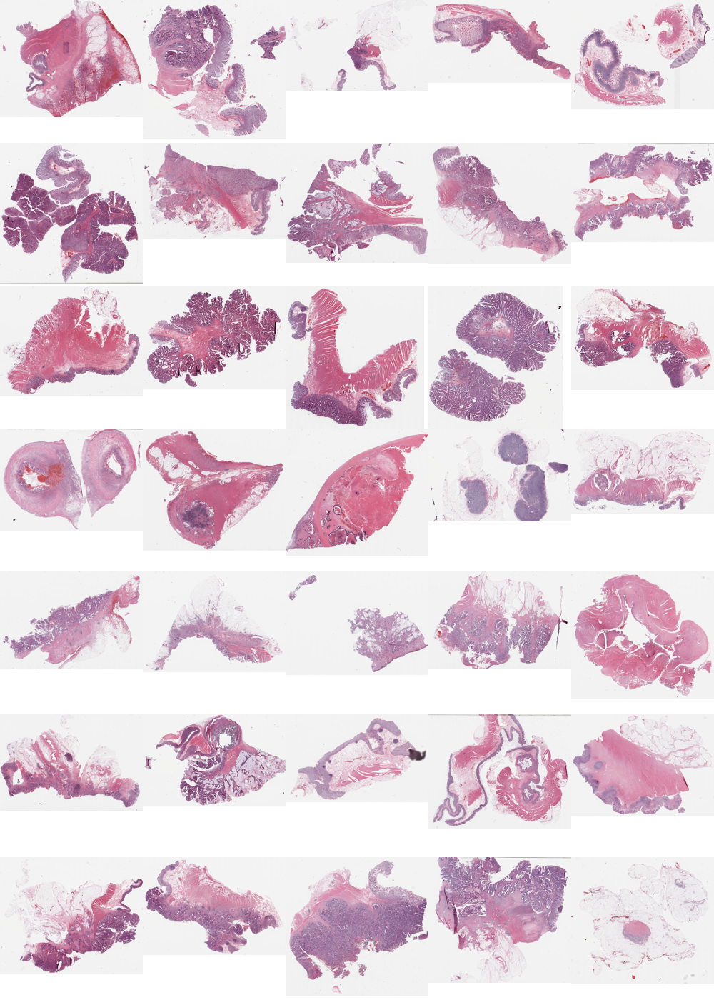

In [10]:
img_grid(he_imgs)

In [27]:
ImageStat.Stat(he_imgs[0]).mean

[219.216306097561, 186.53434634146342, 200.30796219512195]

In [63]:
img_means = []
img_medians = []
for img in he_imgs:
    img_means.append(ImageStat.Stat(img).mean)
    img_medians.append(ImageStat.Stat(img).median)
img_means = np.array(img_means)
img_medians = np.array(img_medians)

In [64]:
r_means = img_means[:,0]
g_means = img_means[:,1]
b_means = img_means[:,2]
r_medians = img_medians[:,0]
g_medians = img_medians[:,1]
b_medians = img_medians[:,2]

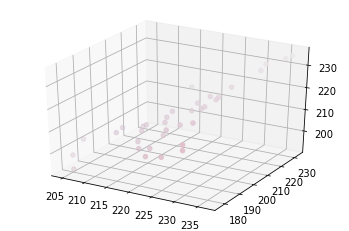

In [71]:
fig = plt.figure()
ax = plt.axes(projection = '3d')
ax.scatter3D(r_means, g_means, b_means, c = img_means/255.0)

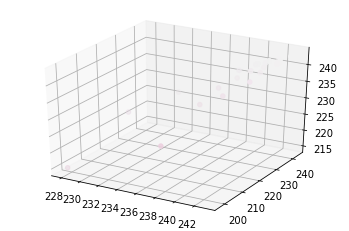

In [70]:
fig = plt.figure()
ax = plt.axes(projection = '3d')
ax.scatter3D(r_medians, g_medians, b_medians, c = img_medians/255.0)

## Stain Normalisation

In [76]:
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))

In [77]:
template_img = read_slide_at_mag(template_slide, 0.5)

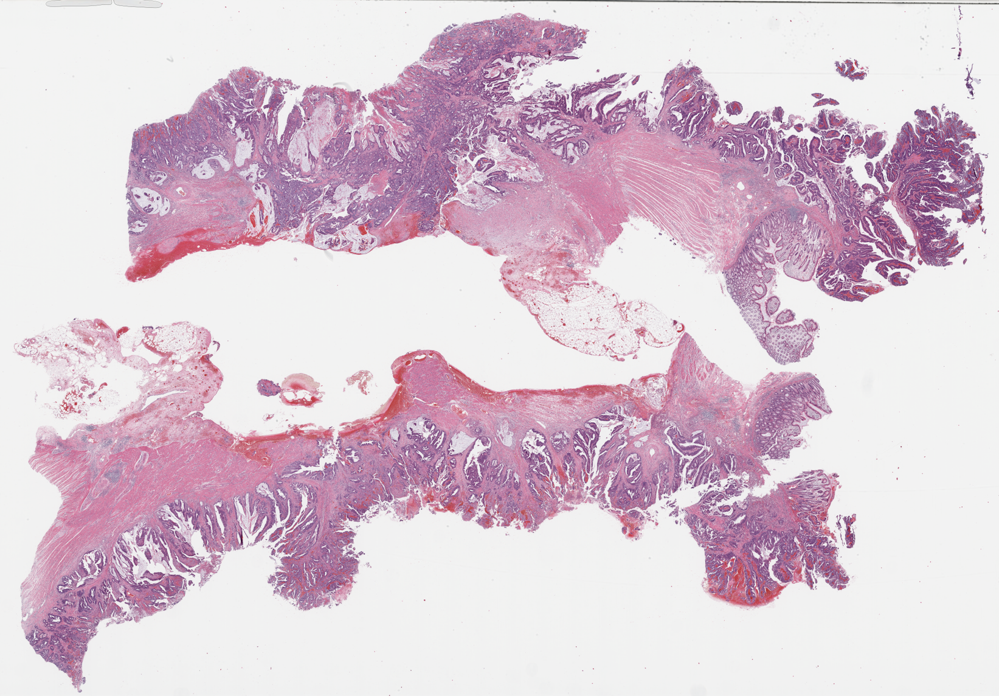

In [80]:
template_img

In [86]:
normaliser = staintools.StainNormalizer(method='vahadane')

In [82]:
template_std = LuminosityStandardizer.standardize(np.array(template_img))

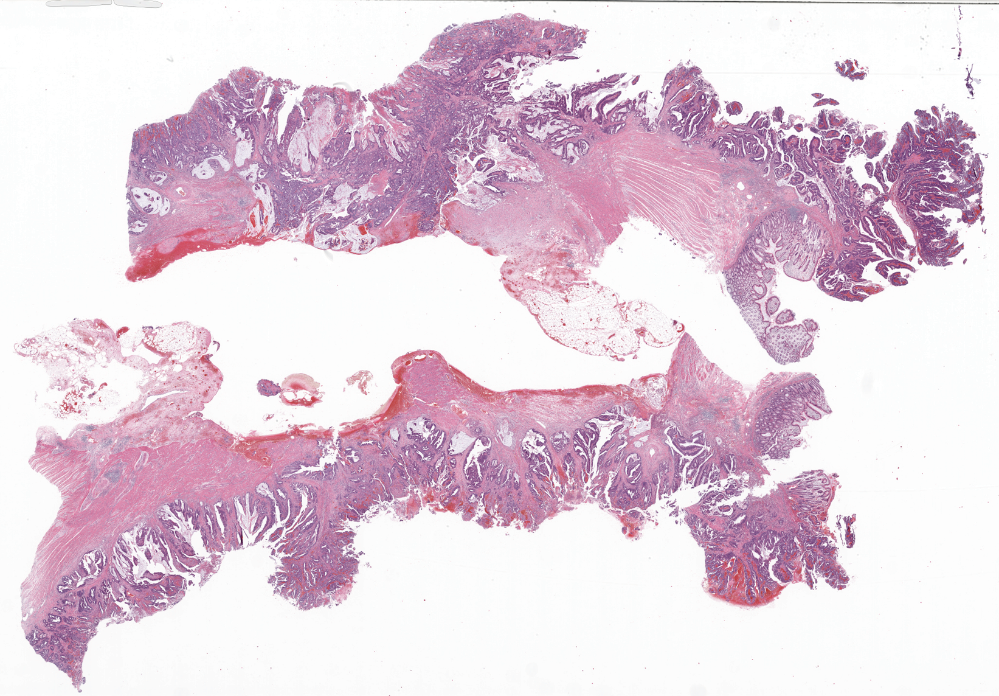

In [85]:
Image.fromarray(template_std)

In [87]:
normaliser.fit(template_std)

In [97]:
slide_norm_imgs = []
for slide_name in HE_slides:
    print(slide_name)
    slide = open_slide(str(SLIDES_PATH.joinpath(slide_name)))
    slide_img = read_slide_at_mag(slide, 0.5)
    slide_std = LuminosityStandardizer.standardize(np.array(slide_img))
    slide_transformed = normaliser.transform(slide_std)
    slide_norm_imgs.append(Image.fromarray(slide_transformed))

1792_T_9500_3_HandE.svs
1794_T_9504_3_HandE.svs
1798_T_9514_3_HandE.svs
1820_N_10545A_2_HandE.svs
1820_T_105452F_2_HandE.svs
1843_T_9561_3_HandE.svs
1879_T_9580_3_HandE.svs
1910_T_9637_3_HandE.svs
1915_T_10464_3_HandE.svs
1919_T_10779_3_HandE.svs
1928_T_9644_3_HandE.svs
1932_T_9876_3_HandE.svs
1939_T_9661_3_HandE.svs
1957_T_9668_3_HandE.svs
2011_T_9699_3_HandE.svs
2019_T_9717_3_HandE.svs
2023_T_9727_3_HandE.svs
2036_T_9729_3_HandE.svs
2038_T_11986_3_HandE.svs
2065_N_12752A_2_HandE.svs
2065_T_12756A_2_HandE.svs
2075_T_9787_3_HandE.svs
2090_T_10594_3_HandE.svs
2107_T_9806_3_HandE.svs
2112_N_12341B_2_HandE.svs
2112_T_12335F_2_HandE.svs
2148_N_11397A_2_HandE.svs
2148_T_11393A_2_HandE.svs
2171_N_11521A_2_HandE.svs
2171_T_11524A_2_HandE.svs
232_T_13230_3_HandE.svs
2382_T_15360_3_HandE.svs
526_T_15907_3_HandE.svs
526_T_15915_3_HandE.svs
526_T_15923_3_HandE.svs


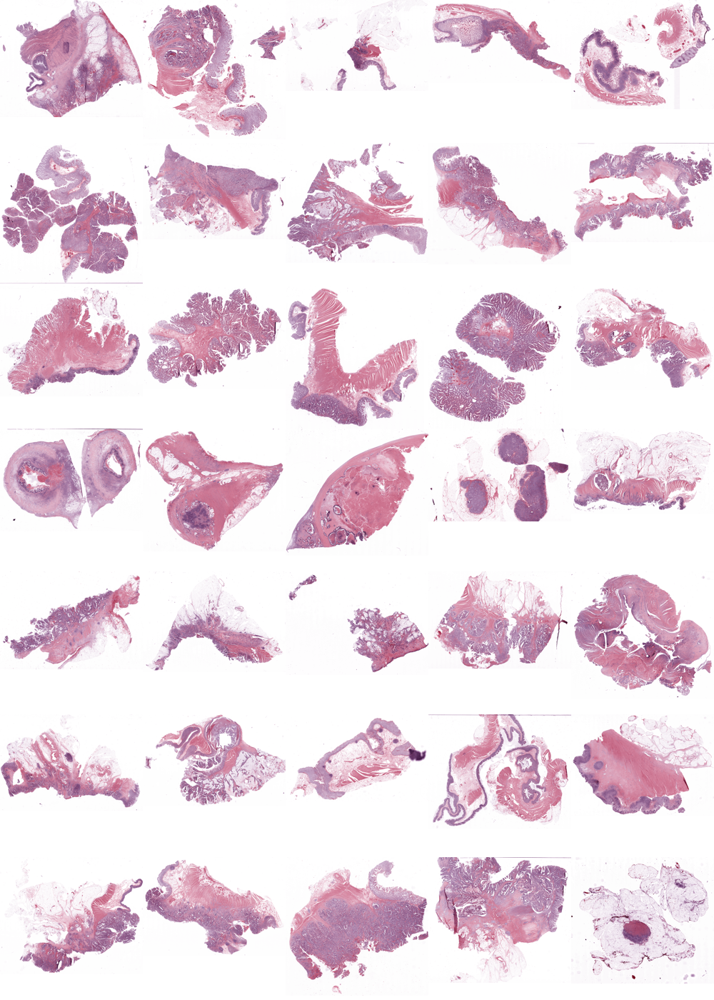

In [98]:
img_grid(slide_norm_imgs)